In [3]:

import numpy as np
import os
import config
import glob
import time
from skimage.color import rgb2lab, lab2rgb
from pathlib import Path
import PIL
from PIL import Image
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torchvision.utils import save_image, make_grid
from tqdm import tqdm
from torchvision.datasets import ImageFolder
import torchvision.transforms as tt
import cv2
from torchvision.utils import save_image
import matplotlib.pyplot as plt
import seaborn as sns
import albumentations as A
import albumentations.pytorch as Ap
%matplotlib inline

In [1]:
pip install config


Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install albumentations

Note: you may need to restart the kernel to use updated packages.


Необходимые трансформации для входного изображения и эталонного:

In [4]:
transform_only_input = A.Compose(
    [   A.Resize(width=256, height=256),
        A.HorizontalFlip(p=0.2),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        A.transforms.ToGray(always_apply=True, p=1.0),
        Ap.ToTensorV2(),
    ]
)

transform_only_mask = A.Compose(
    [   A.Resize(width=256, height=256),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255.0,),
        Ap.ToTensorV2(),
    ]
)

In [5]:
class ColDataset(Dataset):
    def __init__(self, root_dir):
        self.root_dir = root_dir
        self.list_files = os.listdir(self.root_dir)

    def __len__(self):
        return len(self.list_files)

    def __getitem__(self, index):
        img_file = self.list_files[index]
        img_path = os.path.join(self.root_dir, img_file)
        image = np.array(Image.open(img_path))
        input_image, target_image = image, image
       

        input_image = transform_only_input(image=input_image)["image"]
        target_image = transform_only_mask(image=target_image)["image"]
        
        return input_image, target_image
    

Ниже полезные функции для отображения лосса, отрисовки промежуточных изображений, а также лосса для Генератора.

In [60]:
# Credits: https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

class AverageMeter:
    '''
    
    Computes and stores the average and current value for the various losses involved.
    
    '''
    
    def __init__(self):
        self.reset()
        
    def reset(self):
        self.count, self.avg, self.sum = [0.] * 3
    
    def update(self, val, count=1):
        self.count += count
        self.sum += count * val
        self.avg = self.sum / self.count

def create_loss_meters():

    disc_loss_fake = AverageMeter()
    disc_loss_target = AverageMeter()
    disc_loss = AverageMeter()
    loss_G_GAN = AverageMeter()
    loss_G_L1 = AverageMeter()
    loss_G = AverageMeter()


    return {'disc_loss_fake': disc_loss_fake,
            'disc_loss_target': disc_loss_target,
            'disc_loss': disc_loss,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}


def update_losses(model, loss_meter_dict, count):
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)
        loss_meter.update(loss.item(), count=count)

    
def visualize(model, data, save=True):
    '''
    
    Function which helps visualize and see the difference between the input image (grayscale), generated image 
    and the Real image.
    
    '''
    model.generator.eval()
    with torch.no_grad():
        model.prepare_input(data)
        model.forward()
    
    input_images = model.input_img
    fake_images = model.gen_predict.detach()
    real_images = model.target_img
    
    model.generator.train()
    
    fig = plt.figure(figsize=(15, 8))
    for i in range(4):
        ax = plt.subplot(3, 4, i + 1)
        ax.imshow(input_images[i].cpu().permute(1, 2, 0))
        ax.axis("off")
        ax = plt.subplot(3, 4, i + 1 + 4)
        ax.imshow(fake_images[i].cpu().permute(1, 2, 0))
        ax.axis("off")
        ax = plt.subplot(3, 4, i + 1 + 8)
        ax.imshow(real_images[i].cpu().permute(1, 2, 0))
        ax.axis("off")
    plt.show()
    if save:
        fig.savefig(f"colorization_{time.time()}.png")

def log_results(loss_meter_dict):
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")
        

class GANLoss(nn.Module):
    '''
    
    Class that defines the GAN loss.
    
    '''
    
    def __init__(self, gan_mode='vanilla', real_label=1.0, fake_label=0.0):
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        if gan_mode == 'vanilla':
            self.loss = nn.BCEWithLogitsLoss()
        elif gan_mode == 'lsgan':
            self.loss = nn.MSELoss()
    
    def get_labels(self, preds, target_is_real):
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)
    
    def __call__(self, preds, target_is_real):
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

Функции для сохранения и загрузки весов модели

In [8]:
def save_checkpoint(model, optimizer, filename="my_checkpoint.pth.tar"):
    
    '''
    Функция для сохранения весов модели
    '''
    
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    '''
    Функция для загрузки предобученных весов модели
    '''
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])
    for param_group in optimizer.param_groups:
        param_group["lr"] = lr
        

Up и Down блоки для создания Генератора и Дискриминатора

In [9]:
class DownBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        use_norm: bool = True,
        last_layer: bool = False
    ):
        super().__init__()
        stride = 1 if last_layer else 2
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, stride, 1, bias=False, padding_mode="reflect" ),
            nn.BatchNorm2d(out_channels) if use_norm else nn.Identity(),
            nn.LeakyReLU(0.2)
        )
        
    def forward(self,x):
        x = self.conv(x)
        return x

In [10]:
class UpBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        use_norm: bool = True,
        last_layer: bool = False,
        use_dropout: bool = False
    ):
        super().__init__()
        self.conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels) if use_norm else nn.Identity(),
            nn.ReLU()
        )
        self.use_dropout = use_dropout
        self.drop = nn.Dropout(0.5)
        
    def forward(self,x):
        x = self.conv(x)
        return self.drop(x) if self.use_dropout else x

In [11]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.down1 = DownBlock(in_channels*2, 64, use_norm=False)
        self.down2 = DownBlock(64, 128)
        self.down3 = DownBlock(128, 256)
        self.down4 = DownBlock(256, 512, last_layer=True)
        self.final = nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=1, padding_mode="reflect")
        
    def forward(self, x, y):
        x = torch.cat([x, y], dim=1)
        x = self.down1(x)
        x = self.down2(x)
        x = self.down3(x)
        x = self.down4(x)
        x = self.final(x)
        return x

In [12]:
class Generator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        self.input_channels = in_channels
        self.down1 = DownBlock(in_channels, 64, use_norm=False)
        self.down2 = DownBlock(64, 128)
        self.down3 = DownBlock(128, 256)
        self.down4 = DownBlock(256, 512)
        self.down5 = DownBlock(512, 512)
        self.down6 = DownBlock(512, 512)
        self.down7 = DownBlock(512, 512)
        
        self.bottleneck = nn.Sequential(
                          nn.Conv2d(512, 512, 4, 2, 1),
                          nn.ReLU()
        )
        
        self.up1 = UpBlock(512, 512, use_dropout=True)
        self.up2 = UpBlock(1024, 512, use_dropout=True)
        self.up3 = UpBlock(1024, 512, use_dropout=True)
        self.up4 = UpBlock(1024, 512)
        self.up5 = UpBlock(1024, 256)
        self.up6 = UpBlock(512, 128)
        self.up7 = UpBlock(256, 64)
        self.up8 = nn.Sequential(
                   nn.ConvTranspose2d(128, in_channels, 4, 2, 1),
                   nn.Tanh()
        )
        
    def forward(self, x):
        d1 = self.down1(x)
        d2 = self.down2(d1)
        d3 = self.down3(d2)
        d4 = self.down4(d3)
        d5 = self.down5(d4)
        d6 = self.down6(d5)
        d7 = self.down7(d6)
        
        bt = self.bottleneck(d7)
        
        up1 = self.up1(bt)
        up2 = self.up2(torch.concat([up1, d7], dim=1))
        up3 = self.up3(torch.concat([up2, d6], dim=1))
        up4 = self.up4(torch.concat([up3, d5], dim=1))
        up5 = self.up5(torch.concat([up4, d4], dim=1))
        up6 = self.up6(torch.concat([up5, d3], dim=1))
        up7 = self.up7(torch.concat([up6, d2], dim=1))
        up8 = self.up8(torch.concat([up7, d1], dim=1))
        return up8
        

In [52]:
name = 'Kazimir_Malevich'
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

TRAIN_DIR = "/kaggle/input/malevich-set/Kazimir_Malevich/TRAIN/"
VAL_DIR = "/kaggle/input/malevich-set/Kazimir_Malevich/VAL/"
LEARNING_RATE = 2e-4
BATCH_SIZE = 8
NUM_WORKERS = 2
IMAGE_SIZE = 256
CHANNELS_IMG = 3
GAN_MODE = 'vanilla'
L1_LAMBDA = 100
LAMBDA_GP = 10
NUM_EPOCHS = 200
LOAD_MODEL = True
SAVE_MODEL = True
CHECKPOINT_DISC = "discriminator.pth.tar"
CHECKPOINT_GEN = "generator.pth.tar"
CHECKPOINT_DISC_PATH = '/kaggle/working/discriminator.pth.tar'
CHECKPOINT_GEN_PATH ='/kaggle/working/generator.pth.tar'

In [15]:
DEVICE

'cuda'

Функция для инициализации весов модели.

In [35]:
# Normal Weight Initialization with mean = 0, std = 0.02

def init_weights(net, init='norm', gain=0.02):
    
    def init_func(m):
        classname = m.__class__.__name__
        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')
            
            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)
        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)
            
    net.apply(init_func)
    print(f"model initialized with {init} initialization")
    return net

def init_model(model, device):
    model = model.to(device)
    model = init_weights(model)
    return model

Собираем всю сеть вместе

In [17]:
class Pix2Pix(nn.Module):
    '''
    
    The Class where it all comes together.
    
    '''
    
    def __init__(self,generator = None,gen_lr =LEARNING_RATE, discriminator=None, disc_lr = LEARNING_RATE, beta1 = 0.05,beta2 = 0.999, lambda_l1 = L1_LAMBDA, device=DEVICE):
        super().__init__()
        self.device = device
        self.lambda_l1 = lambda_l1
        
        if generator is None:
            self.generator = init_model(Generator(),self.device)
        else:
            self.generator = generator.to(self.device)
        if discriminator is None:
            self.discriminator = init_model(Discriminator(),self.device)
        else:
            self.discriminator = discriminator.to(self.device)
        
        
        self.GANloss = GANLoss(gan_mode=GAN_MODE).to(self.device)
        self.L1loss = nn.L1Loss()
        self.gen_optim = optim.Adam(self.generator.parameters(), lr=gen_lr, betas=(beta1, beta2))
        self.disc_optim= optim.Adam(self.discriminator.parameters(), lr=disc_lr, betas=(beta1, beta2))
        
    def requires_grad(self,model,requires_grad = True):
        for p in model.parameters():
            p.requires_grad = requires_grad
            
    def prepare_input(self,data):
        self.input_img = data[0].to(self.device)
        self.target_img = data[1].to(self.device)
        
    def forward(self):
        self.gen_predict = self.generator(self.input_img)
        
    def disc_backward(self):
        fake_image = self.gen_predict
        fake_image_pred = self.discriminator(self.input_img, fake_image.detach()) 
        self.disc_loss_fake = self.GANloss(fake_image_pred, False)     
        target_image = self.target_img
        target_pred = self.discriminator(self.input_img, target_image) 
        self.disc_loss_target = self.GANloss(target_pred, True)
        self.disc_loss = (self.disc_loss_fake + self.disc_loss_target) * 0.5
        
        self.disc_loss.backward()
    
    def gen_backward(self):
        fake_image = self.gen_predict
        fake_image_preds = self.discriminator(self.input_img, fake_image)
        self.loss_G_GAN = self.GANloss(fake_image_preds, True)
        self.loss_G_L1 = self.L1loss(self.gen_predict, self.target_img) * self.lambda_l1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1
        self.loss_G.backward()
    
    def optimize(self):
        self.forward()
        self.discriminator.train()
        self.requires_grad(self.discriminator, True)
        self.disc_optim.zero_grad()
        self.disc_backward()
        self.disc_optim.step()
        
        self.generator.train()
        self.requires_grad(self.discriminator, False) 
        self.gen_optim.zero_grad()
        self.gen_backward()
        self.gen_optim.step()

Функция тренировки сети

In [23]:
def train_model(model, train_loader, epochs, display=100, SAVE_MODEL = True, LOAD_MODEL=True):    
    data = next(iter(train_loader)) 
    
    for epoch in range(epochs):
        
        loss_meter_dict = create_loss_meters() 
        i=0
        for data in tqdm(train_loader, leave=True):
            model.prepare_input(data) 
            model.optimize()
            update_losses(model, loss_meter_dict, count=data[0].size(0)) 
            #update_losses(model, loss_meter_dict, count=data["L"].size(0)) 
            i+=1
            if i % display == 0:
                print(f"\nEpoch {epoch+1}/{epochs}")
                print(f"Iteration {i}/{len(train_loader)}")
                log_results(loss_meter_dict) 
                visualize(model, data, save=False)
                
        if epoch % 10 == 0 and SAVE_MODEL:
                save_checkpoint(model.generator, model.gen_optim, filename= CHECKPOINT_GEN)
                save_checkpoint(model.discriminator, model.disc_optim, filename= CHECKPOINT_DISC)

In [49]:
train_dataset = ColDataset(root_dir=TRAIN_DIR)
train_loader = DataLoader(train_dataset,
                          batch_size=BATCH_SIZE,
                          shuffle=True,
                          num_workers=NUM_WORKERS)
val_dataset = ColDataset(root_dir=VAL_DIR)
val_loader = DataLoader(train_dataset,
                          batch_size=BATCH_SIZE,
                          shuffle=False,
                          num_workers=NUM_WORKERS)

=> Loading checkpoint
=> Loading checkpoint


 50%|█████     | 7/14 [00:01<00:01,  5.14it/s]


Epoch 1/11
Iteration 8/14
disc_loss_fake: 0.61666
disc_loss_target: 0.51166
disc_loss: 0.56416
loss_G_GAN: 1.21981
loss_G_L1: 11.47936
loss_G: 12.69917


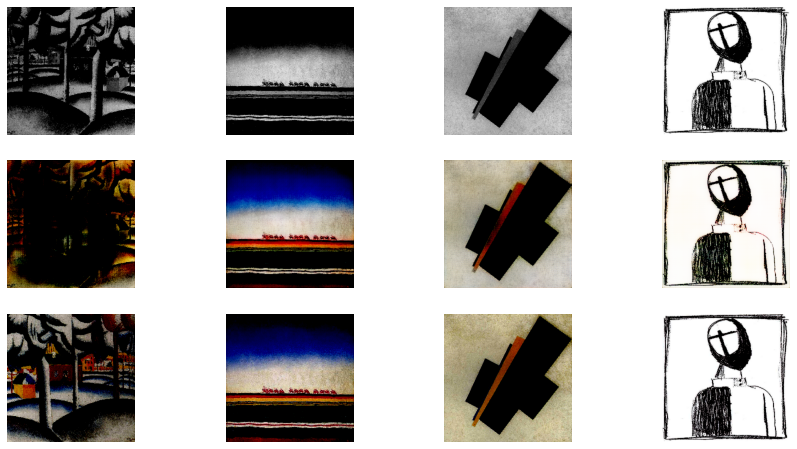

100%|██████████| 14/14 [00:03<00:00,  3.89it/s]


=> Saving checkpoint
=> Saving checkpoint


 50%|█████     | 7/14 [00:01<00:01,  5.20it/s]


Epoch 2/11
Iteration 8/14
disc_loss_fake: 0.57346
disc_loss_target: 0.55100
disc_loss: 0.56223
loss_G_GAN: 1.54765
loss_G_L1: 10.84518
loss_G: 12.39283


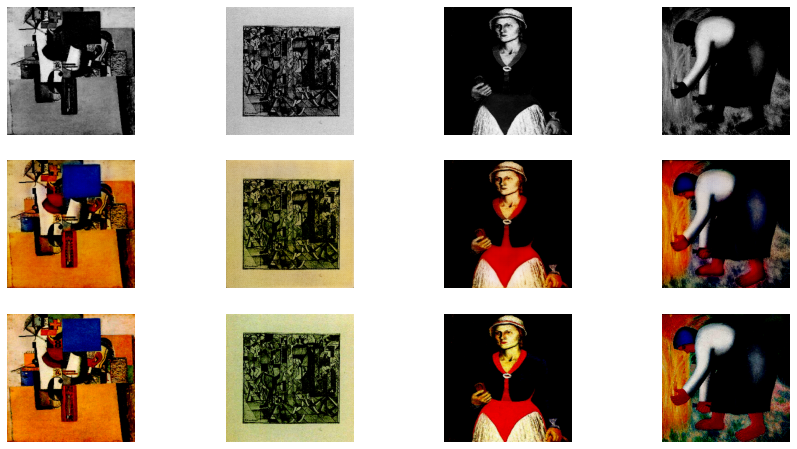

 50%|█████     | 7/14 [00:01<00:01,  5.16it/s]


Epoch 3/11
Iteration 8/14
disc_loss_fake: 0.52922
disc_loss_target: 0.65760
disc_loss: 0.59341
loss_G_GAN: 1.14696
loss_G_L1: 14.23031
loss_G: 15.37727


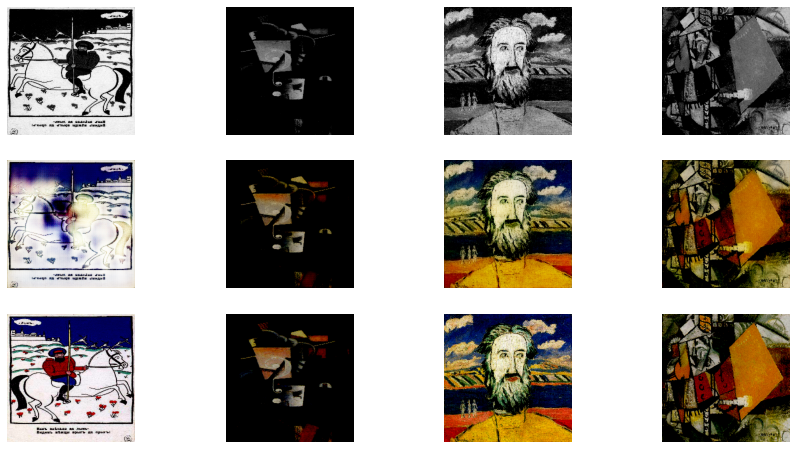

 50%|█████     | 7/14 [00:01<00:01,  5.04it/s]


Epoch 4/11
Iteration 8/14
disc_loss_fake: 0.69899
disc_loss_target: 0.48231
disc_loss: 0.59065
loss_G_GAN: 1.09762
loss_G_L1: 13.90251
loss_G: 15.00013


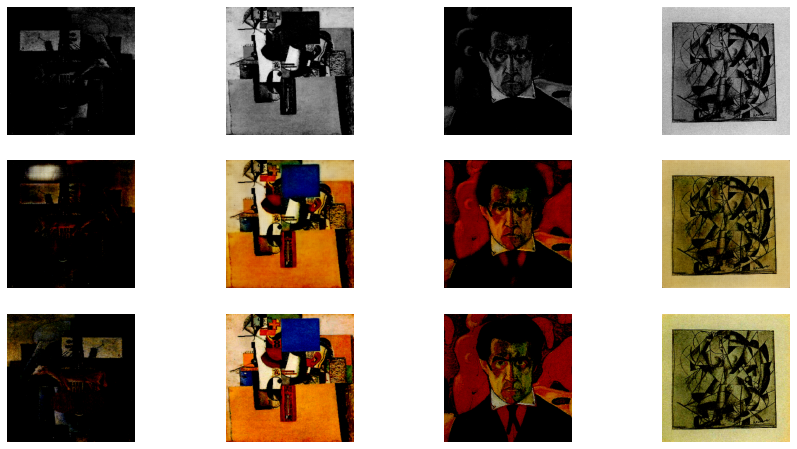

 50%|█████     | 7/14 [00:01<00:01,  4.63it/s]


Epoch 5/11
Iteration 8/14
disc_loss_fake: 0.49034
disc_loss_target: 0.41368
disc_loss: 0.45201
loss_G_GAN: 1.28383
loss_G_L1: 9.78484
loss_G: 11.06868


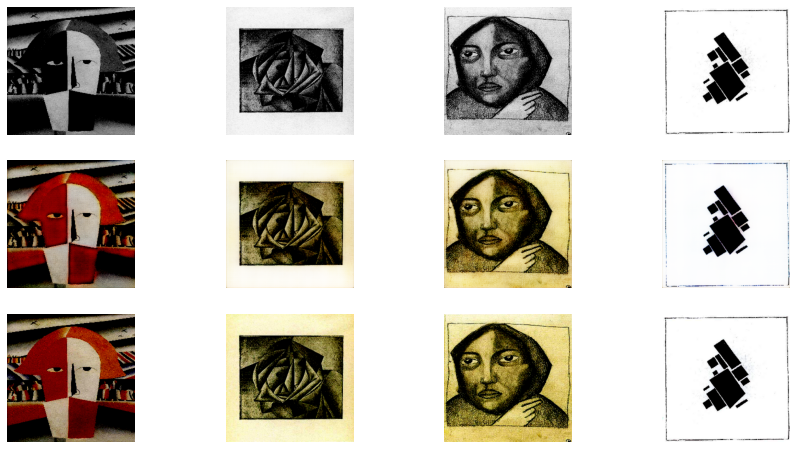

 50%|█████     | 7/14 [00:01<00:01,  5.16it/s]


Epoch 6/11
Iteration 8/14
disc_loss_fake: 0.66993
disc_loss_target: 0.45643
disc_loss: 0.56318
loss_G_GAN: 1.34291
loss_G_L1: 10.49762
loss_G: 11.84053


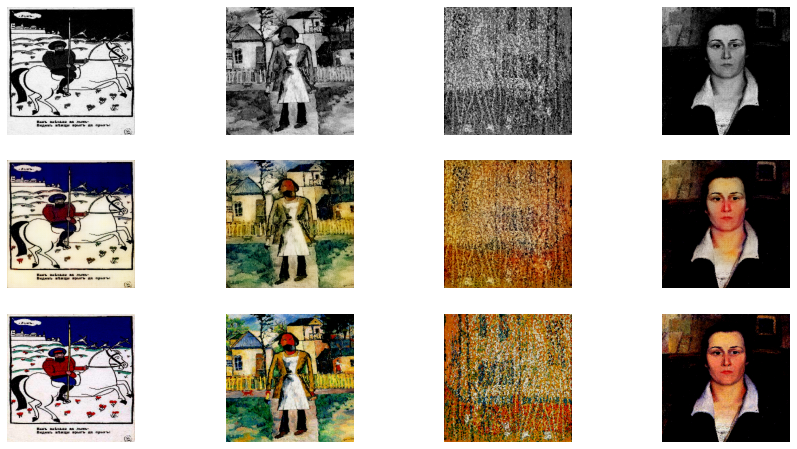

 50%|█████     | 7/14 [00:01<00:01,  4.88it/s]


Epoch 7/11
Iteration 8/14
disc_loss_fake: 0.49602
disc_loss_target: 0.66540
disc_loss: 0.58071
loss_G_GAN: 1.18727
loss_G_L1: 13.48331
loss_G: 14.67058


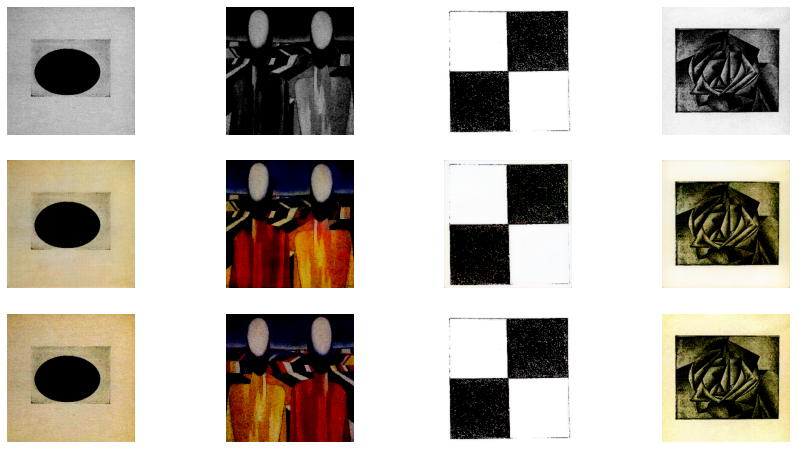

 50%|█████     | 7/14 [00:01<00:01,  5.12it/s]


Epoch 8/11
Iteration 8/14
disc_loss_fake: 0.62291
disc_loss_target: 0.58491
disc_loss: 0.60391
loss_G_GAN: 1.08228
loss_G_L1: 12.12473
loss_G: 13.20701


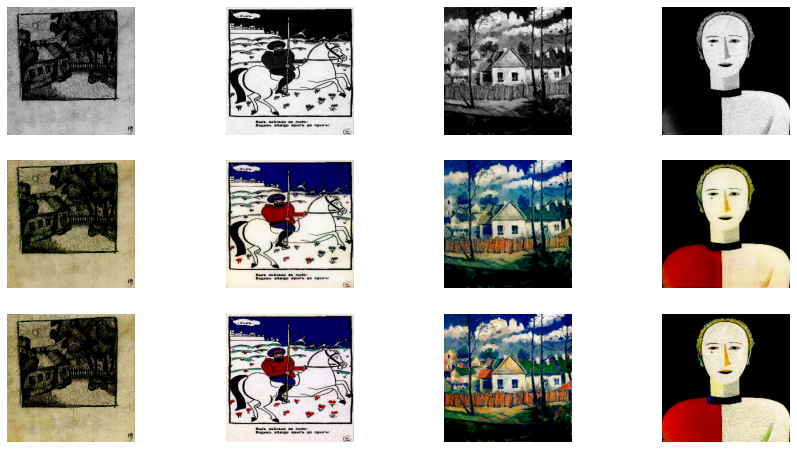

 50%|█████     | 7/14 [00:01<00:01,  5.15it/s]


Epoch 9/11
Iteration 8/14
disc_loss_fake: 0.59131
disc_loss_target: 0.46489
disc_loss: 0.52810
loss_G_GAN: 1.16668
loss_G_L1: 10.54789
loss_G: 11.71457


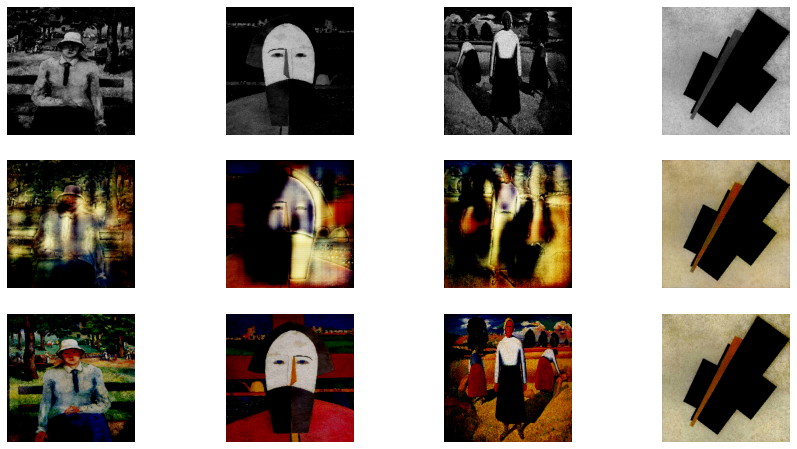

 50%|█████     | 7/14 [00:01<00:01,  4.99it/s]


Epoch 10/11
Iteration 8/14
disc_loss_fake: 0.45439
disc_loss_target: 0.47650
disc_loss: 0.46545
loss_G_GAN: 1.39230
loss_G_L1: 10.71844
loss_G: 12.11074


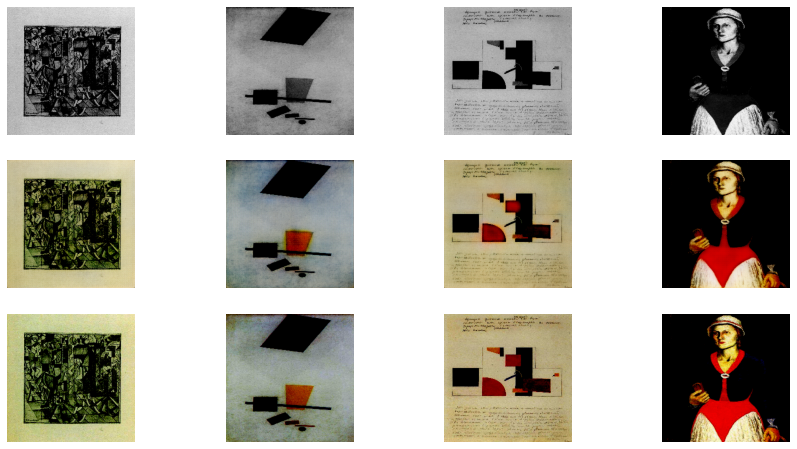

 50%|█████     | 7/14 [00:01<00:01,  5.19it/s]


Epoch 11/11
Iteration 8/14
disc_loss_fake: 0.49174
disc_loss_target: 0.32604
disc_loss: 0.40889
loss_G_GAN: 1.39244
loss_G_L1: 12.50437
loss_G: 13.89681


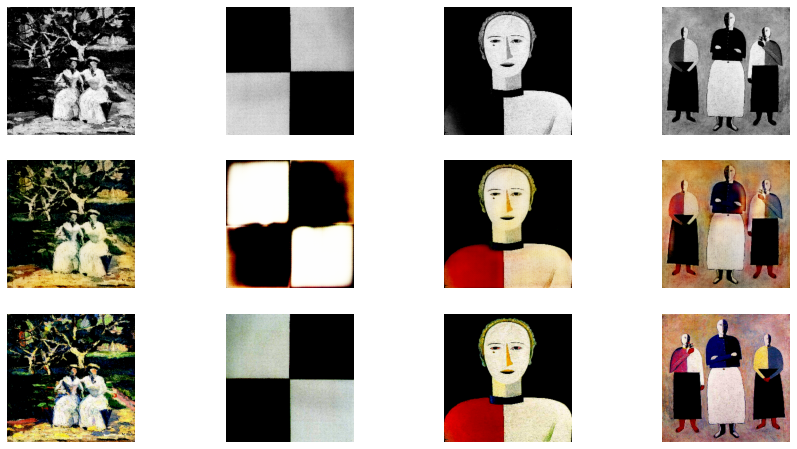

100%|██████████| 14/14 [00:03<00:00,  3.67it/s]


=> Saving checkpoint
=> Saving checkpoint


In [59]:
if LOAD_MODEL:
    generator = Generator().to(DEVICE)
    discriminator = Discriminator().to(DEVICE)
    gen_optim = optim.Adam(generator.parameters(), lr=LEARNING_RATE, betas=(0.05, 0.999))
    disc_optim= optim.Adam(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.05, 0.999))
    load_checkpoint('/kaggle/working/generator.pth.tar', generator, gen_optim, lr=LEARNING_RATE)
    load_checkpoint('/kaggle/working/discriminator.pth.tar', discriminator, disc_optim, lr=LEARNING_RATE)
   
    model = Pix2Pix(generator=generator, discriminator=discriminator)
    
else:
    model = Pix2Pix()
train_model(model, train_loader, epochs=11, display=8, SAVE_MODEL=SAVE_MODEL, LOAD_MODEL=LOAD_MODEL)


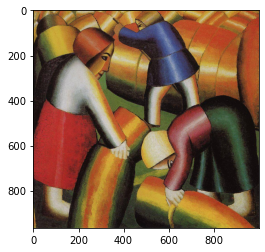

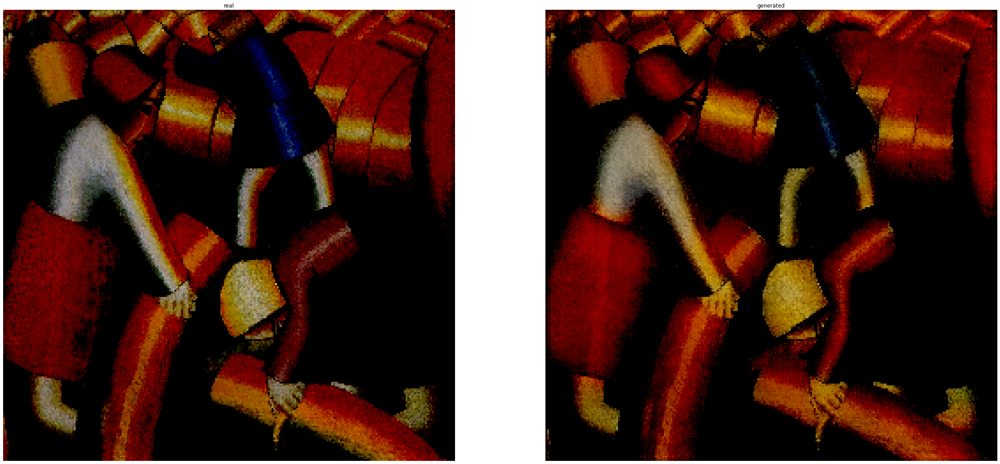

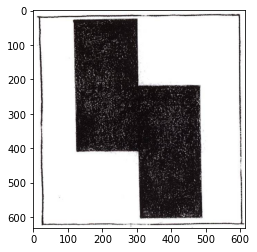

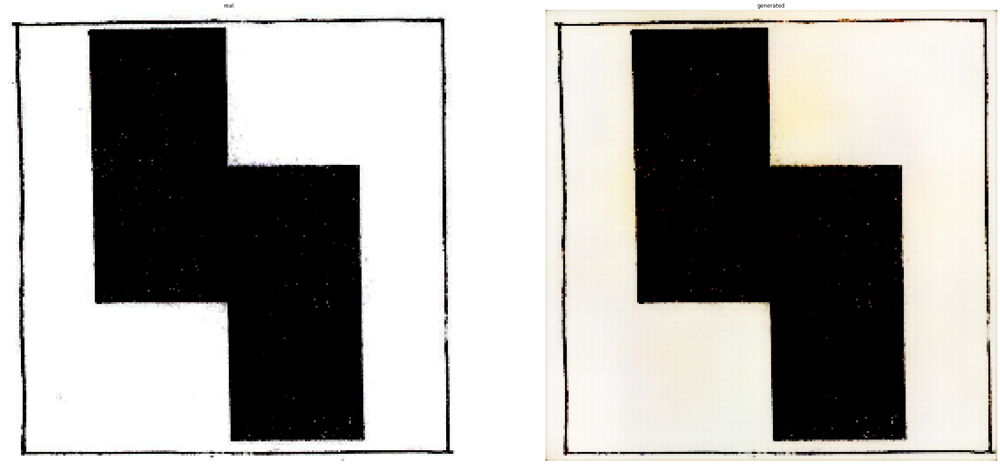

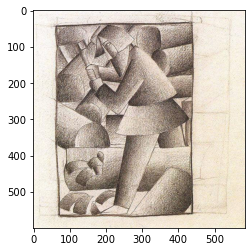

...

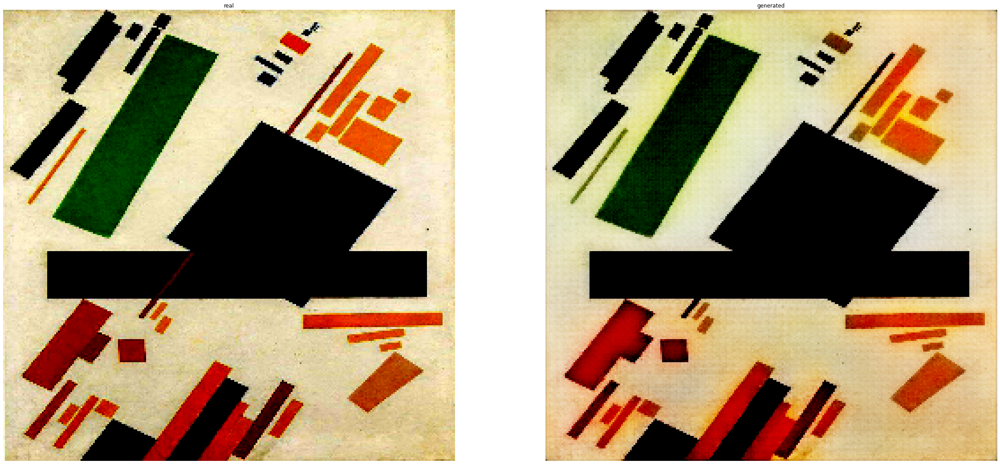

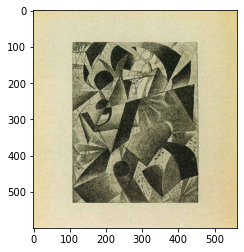

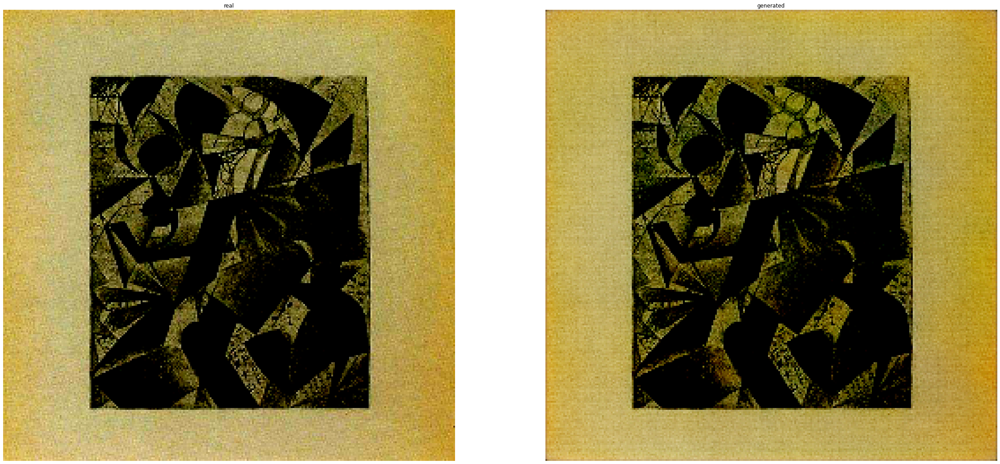

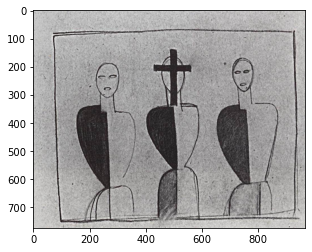

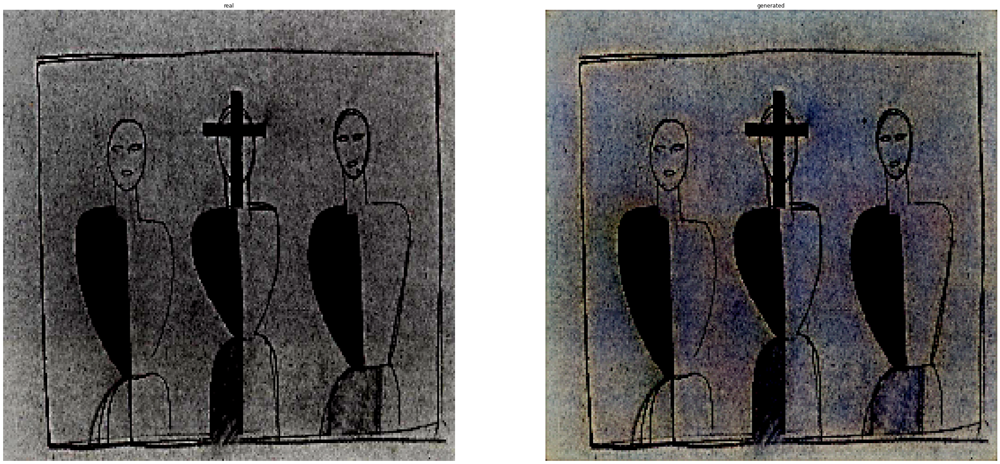

In [46]:

def gen_and_print(path):
    plt.imshow(Image.open(path))
    input_img = np.array(Image.open(path))
    y = transform_only_mask(image=input_img)["image"]
    img = transform_only_input(image=input_img)["image"]


    model.eval()
    with torch.no_grad():
        preds = model.generator(img.unsqueeze(0).to(DEVICE))

    y_fake = preds[0].cpu()
 

    images = [y, y_fake]
    titles = ['real','generated']
    
    fig, ax = plt.subplots(1, 2, figsize=(40,40))
    for idx,img in enumerate(images):
        ax[idx].imshow(img.permute(1, 2, 0))
        ax[idx].axis("off")
    for idx, title in enumerate(titles):    
        ax[idx].set_title('{}'.format(title))
    plt.show()
    
for i in range (110,125):
    path = f"{VAL_DIR}/{name}/{name}_{i}.jpg"
    try:
        gen_and_print(path)
    except:
        pass
    